In [86]:
import pandas as pd
df = pd.read_csv('/content/Bangalore.csv')

In [87]:
df.head() #explorind first 5 rows of data

,Price,Area,Location,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Stadium
0,30000000,3340,JP Nagar Phase 1,4,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
1,7888000,1045,Dasarahalli on Tumkur Road,2,0,0,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
2,4866000,1179,Kannur on Thanisandra Main Road,2,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
3,8358000,1675,Doddanekundi,3,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,6845000,1670,Kengeri,3,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0


In [88]:
df.shape # to fins rows and columns of dataset

(6207, 40)

In [89]:
df.isnull().sum() # to check for null values

,0
Price,0
Area,0
Location,0
No. of Bedrooms,0
Resale,0
MaintenanceStaff,0
Gymnasium,0
SwimmingPool,0
LandscapedGardens,0
JoggingTrack,0


In [90]:
df.describe()

,Price,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,LiftAvailable,BED,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Stadium
count,6.207000e+03,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,...,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000
mean,1.058510e+07,1526.094248,2.556952,0.078782,6.208797,6.461576,6.436121,6.382471,6.396649,6.373933,...,6.438537,6.211052,6.311100,6.210569,6.181569,6.210569,6.210569,6.210569,6.171097,6.210569
std,1.410943e+07,764.845609,0.694300,0.269420,4.126883,3.752421,3.792567,3.875271,3.853661,3.888204,...,3.788782,4.123761,3.981513,4.124430,4.164294,4.124430,4.124430,4.124430,4.178546,4.124430
min,2.000000e+06,415.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000e+06,1110.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.368000e+06,1340.000000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,1.070000e+07,1662.500000,3.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
max,3.000000e+08,9900.000000,7.000000,1.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000


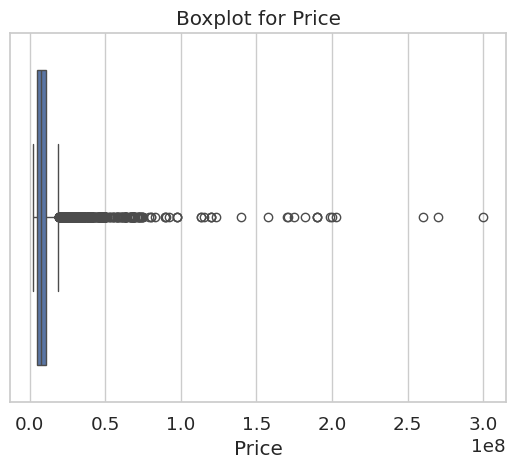

In [91]:
#outliers through box plot
import seaborn as sns
import matplotlib.pyplot as plt

# For a specific column, e.g., 'Price'
sns.boxplot(x=df['Price'])
plt.title("Boxplot for Price")
plt.show()

# **✅ What Does Log Transformation Do?**
Log transformation helps when our data (like Price) is heavily skewed — meaning a lot of small values and a few extremely large ones.

📉 Your Case:
Here Price column has:

A cluster of low values near 0

Outliers up to 300 million+

This kind of data distorts visualizations and regression models because extreme values pull everything in their direction.

🔍 Log Transformation Formula:
python
Copy
Edit
df['LogPrice'] = np.log1p(df['Price'])
np.log1p(x) means log(1 + x).

It safely handles 0 values (since log(0) is undefined).

It compresses large values and spreads out small ones.

📊 Before vs After
Value	Log1p(Value)
1000	6.91
1,000,000	13.82
300,000,000	19.52

So, 300 million becomes just ~19.5, making the distribution easier to work with.

✅ Benefits :
Reduces outlier impact in regression and visualization

Makes data more normal-like (bell-shaped)

Helps regression find more stable, meaningful patterns

Makes visual plots (like regplot, heatmaps) clearer

🧪 Example Use:
python
Copy
Edit
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

df['LogPrice'] = np.log1p(df['Price'])
sns.regplot(x=df['Area'], y=df['LogPrice'])
plt.title("Area vs Log Price")
plt.show()


In [92]:
import numpy as np

# Step 1: Create 'LogPrice' without removing 'Price'
df['LogPrice'] = np.log1p(df['Price'])  # Handles log(0) safely

# Step 2: Move 'Price' to second-last and 'LogPrice' to last
cols = list(df.columns)

# Remove 'Price' and 'LogPrice' temporarily
cols.remove('Price')
cols.remove('LogPrice')

# Add 'Price' and 'LogPrice' at the end
cols.insert(len(cols), 'Price')      # second-last
cols.insert(len(cols), 'LogPrice')   # last

# Reorder DataFrame
df = df[cols]


In [93]:
# Get current column list
cols = list(df.columns)

# Swap Area (index 0) with Location (index 1)
cols[0], cols[1] = cols[1], cols[0]

# Reassign reordered columns to the DataFrame
df = df[cols]


In [94]:
df.head()

,Location,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Stadium,Price,LogPrice
0,JP Nagar Phase 1,3340,4,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,30000000,17.216708
1,Dasarahalli on Tumkur Road,1045,2,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,7888000,15.880853
2,Kannur on Thanisandra Main Road,1179,2,0,0,1,1,1,1,1,...,0,0,0,0,0,0,0,0,4866000,15.397783
3,Doddanekundi,1675,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,8358000,15.938730
4,Kengeri,1670,3,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,6845000,15.739029


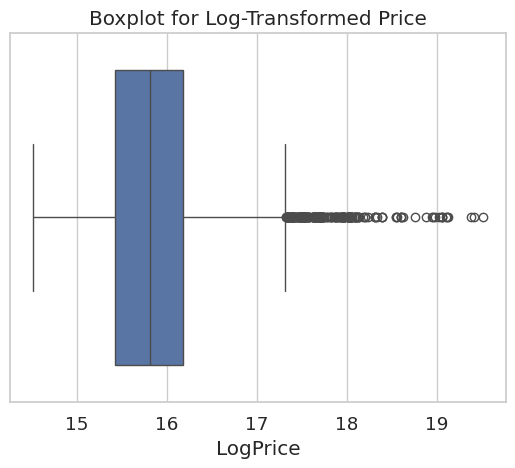

In [95]:
sns.boxplot(x=df['LogPrice'])
plt.title('Boxplot for Log-Transformed Price')
plt.show()


<Axes: xlabel='Area', ylabel='LogPrice'>

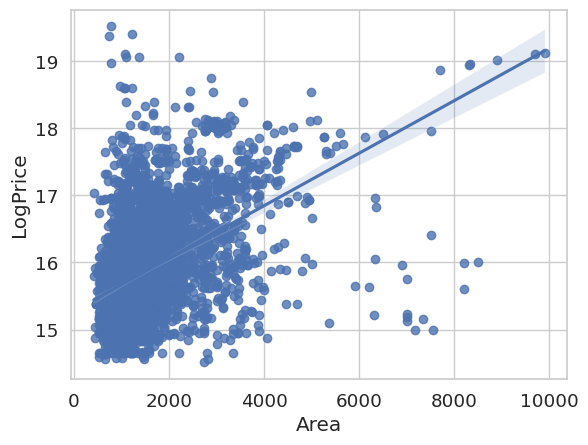

In [96]:
sns.regplot(x=df['Area'], y=df['LogPrice'])


<Axes: xlabel='Area', ylabel='Price'>

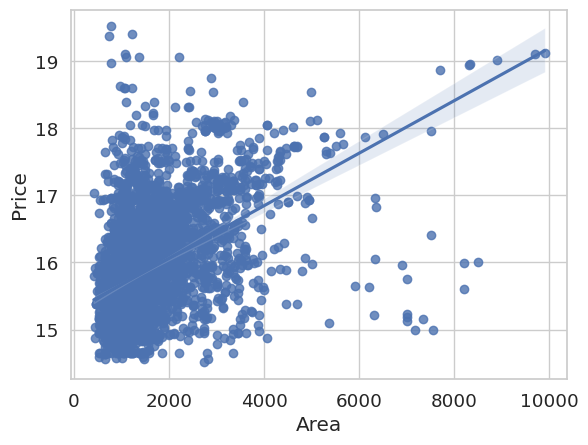

In [97]:
sns.regplot(x=df['Area'], y=np.log1p(df['Price']))


In [98]:
df.head()

,Location,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Stadium,Price,LogPrice
0,JP Nagar Phase 1,3340,4,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,30000000,17.216708
1,Dasarahalli on Tumkur Road,1045,2,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,7888000,15.880853
2,Kannur on Thanisandra Main Road,1179,2,0,0,1,1,1,1,1,...,0,0,0,0,0,0,0,0,4866000,15.397783
3,Doddanekundi,1675,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,8358000,15.938730
4,Kengeri,1670,3,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,6845000,15.739029


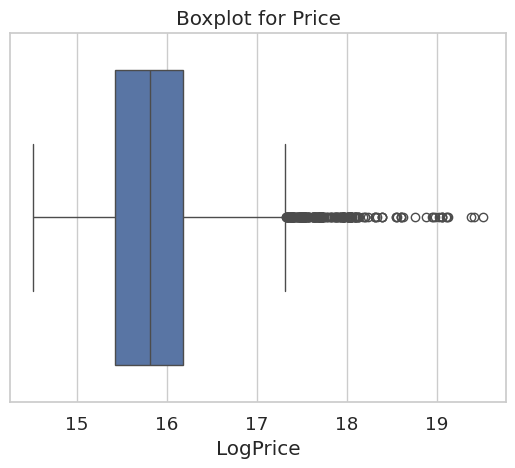

In [99]:
#outliers through box plot
import seaborn as sns
import matplotlib.pyplot as plt

# For a specific column, e.g., 'Price'
sns.boxplot(x=df['LogPrice'])
plt.title("Boxplot for Price")
plt.show()


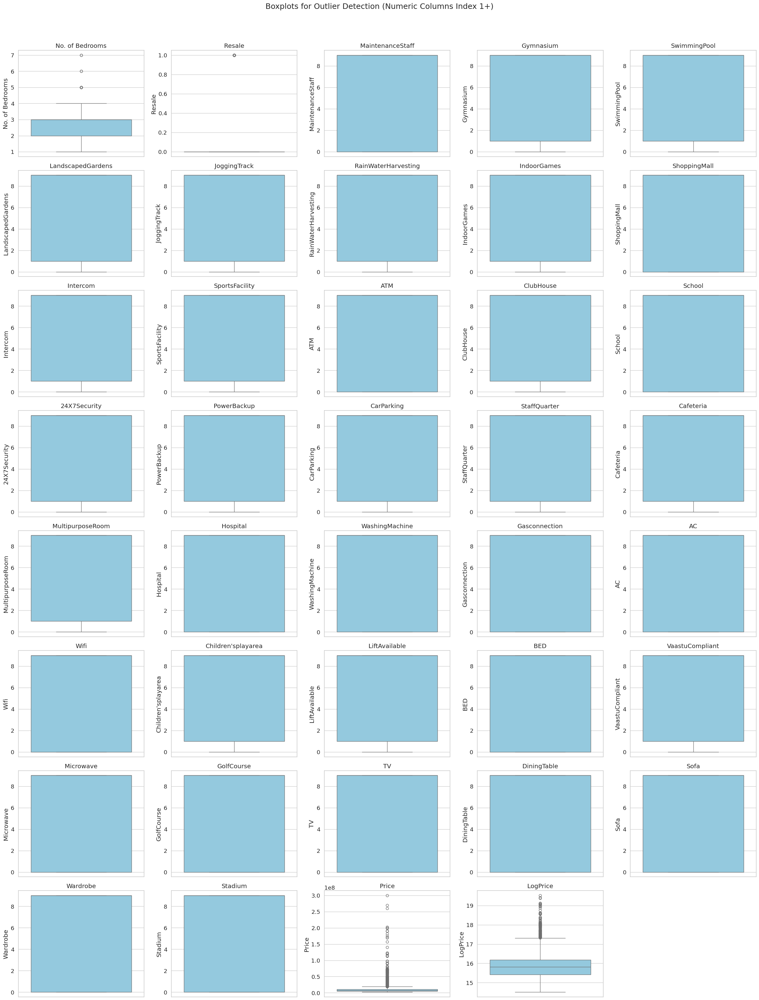

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select numeric columns starting from index 2 (i.e., skipping 'Location' and 'Area')
num_cols = df.select_dtypes(include=['number']).columns[1:]  # 'Area' at index 1

# Set up grid size for subplots
n_cols = 5  # Number of plots per row
n_rows = (len(num_cols) + n_cols - 1) // n_cols  # Total rows needed

# Plot boxplots
plt.figure(figsize=(5 * n_cols, 4 * n_rows))

for idx, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.boxplot(data=df, y=col, color='skyblue')
    plt.title(col)
    plt.tight_layout()

plt.suptitle("Boxplots for Outlier Detection (Numeric Columns Index 1+)", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()


In [101]:
df.head()

,Location,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,...,VaastuCompliant,Microwave,GolfCourse,TV,DiningTable,Sofa,Wardrobe,Stadium,Price,LogPrice
0,JP Nagar Phase 1,3340,4,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,30000000,17.216708
1,Dasarahalli on Tumkur Road,1045,2,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,7888000,15.880853
2,Kannur on Thanisandra Main Road,1179,2,0,0,1,1,1,1,1,...,0,0,0,0,0,0,0,0,4866000,15.397783
3,Doddanekundi,1675,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,8358000,15.938730
4,Kengeri,1670,3,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,6845000,15.739029


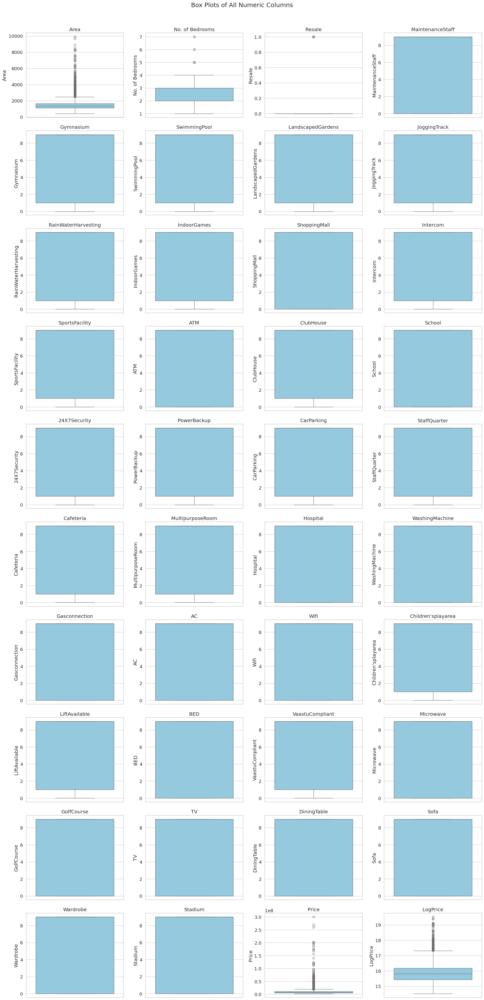

In [102]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Define subplot layout
n_cols = 4  # Plots per row
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols  # Ceiling division

# Plot
plt.figure(figsize=(5 * n_cols, 4 * n_rows))

for idx, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.boxplot(y=df[col], color='skyblue')
    plt.title(col)

plt.tight_layout()
plt.suptitle("Box Plots of All Numeric Columns", fontsize=18, y=1.02)
plt.show()


WE OBSERVE ALOT OF OUTLIERS IN AREA AND LOG PRICE, FIRST WE WILL COUNT NO OF OUTLIERS IN BOTH AND THEN DECIDE WHETHER TO KEEP IT OR NOT.

In [103]:
def count_outliers_iqr(column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count outliers
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return len(outliers)

# Count outliers in both columns
area_outliers = count_outliers_iqr('Area')
logprice_outliers = count_outliers_iqr('LogPrice')

print(f"Number of outliers in Area: {area_outliers}")
print(f"Number of outliers in LogPrice: {logprice_outliers}")


Number of outliers in Area: 526
Number of outliers in LogPrice: 223


In [104]:
# Show only Area and Price columns of outliers
# Calculate IQR for Area
Q1 = df['Area'].quantile(0.25)
Q3 = df['Area'].quantile(0.75)
IQR = Q3 - Q1

# Outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter outliers based on Area
area_outliers = df[(df['Area'] < lower_bound) | (df['Area'] > upper_bound)]

# Show only Area and Price columns of outliers
print(area_outliers[['Area', 'Price']])


      Area     Price
0     3340  30000000
6     2502  20000000
18    3340  30000000
24    2502  20000000
38    3340  30000000
...    ...       ...
6150  8500   8900000
6154  2920   9600000
6158  3375   7159999
6167  3240   9500000
6182  3000   5000000

[526 rows x 2 columns]


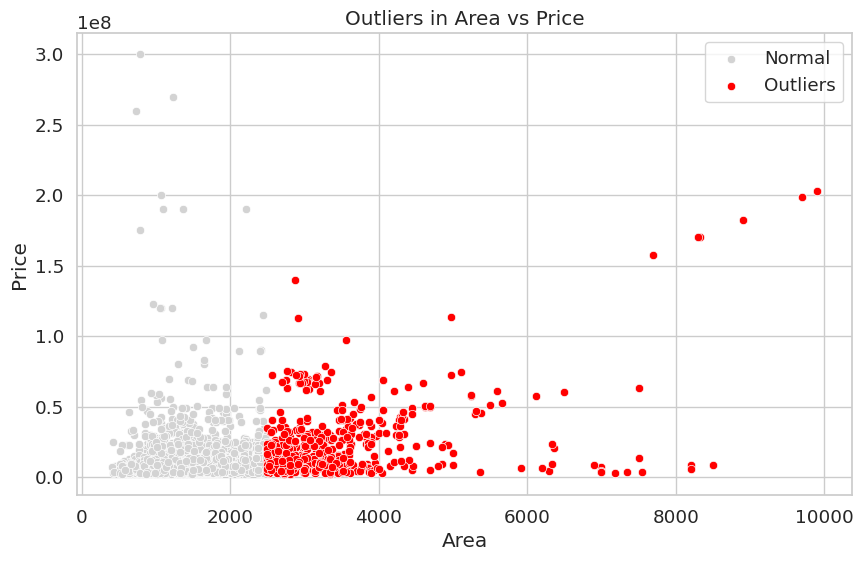

In [105]:
#Visualize outliers

plt.figure(figsize=(10, 6))
# Plot all data in light gray
sns.scatterplot(data=df, x='Area', y='Price', label='Normal', color='lightgray')

# Plot outliers in red
sns.scatterplot(data=area_outliers, x='Area', y='Price', label='Outliers', color='red')

plt.title('Outliers in Area vs Price')
plt.xlabel('Area')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()


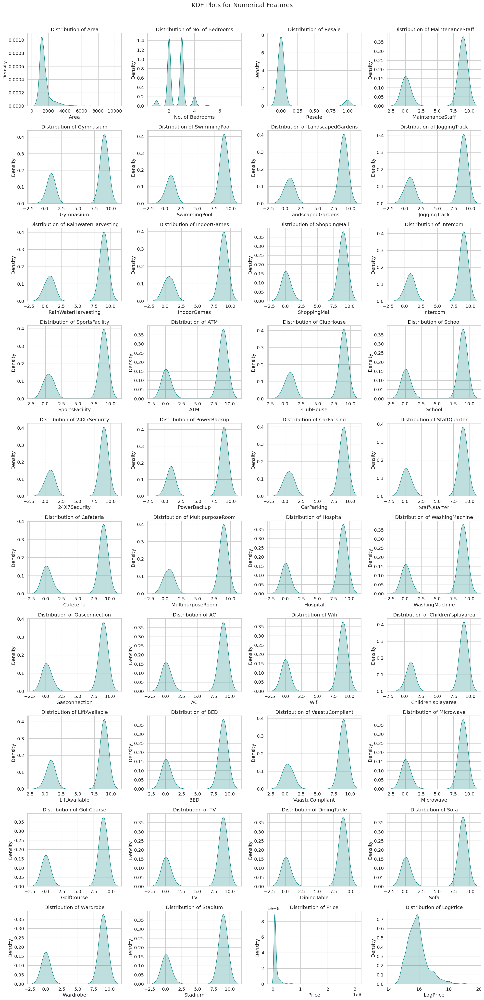

In [106]:
#DISTRIBUTION OF NUMERICAL FEATURES
import matplotlib.pyplot as plt
import seaborn as sns

# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Set number of plots per row
n_cols = 4
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(5 * n_cols, 4 * n_rows))

# Plot each column using KDE
for idx, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.kdeplot(df[col], fill=True, color='teal')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')

plt.tight_layout()
plt.suptitle("KDE Plots for Numerical Features", fontsize=18, y=1.02)
plt.show()


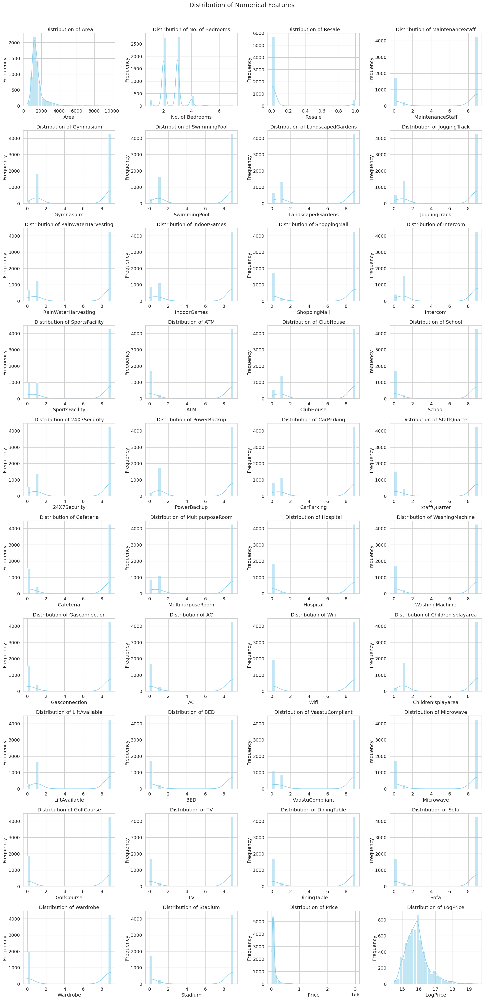

In [107]:
#using HISTOGRAMS
import matplotlib.pyplot as plt
import seaborn as sns

# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Set number of plots per row
n_cols = 4
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

# Set up the figure
plt.figure(figsize=(5 * n_cols, 4 * n_rows))

# Plot each numeric column
for idx, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.suptitle("Distribution of Numerical Features", fontsize=18, y=1.02)
plt.show()


In [108]:
#pair plot
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])


# Set larger plot size for visibility
sns.set(style="whitegrid", font_scale=1.2)

# Create the pairplot with larger size
pairplot = sns.pairplot(numeric_df, corner=True, height=2.5, aspect=1)

plt.suptitle("Pairplot of Numerical Features", fontsize=20, y=1.02)
plt.show()


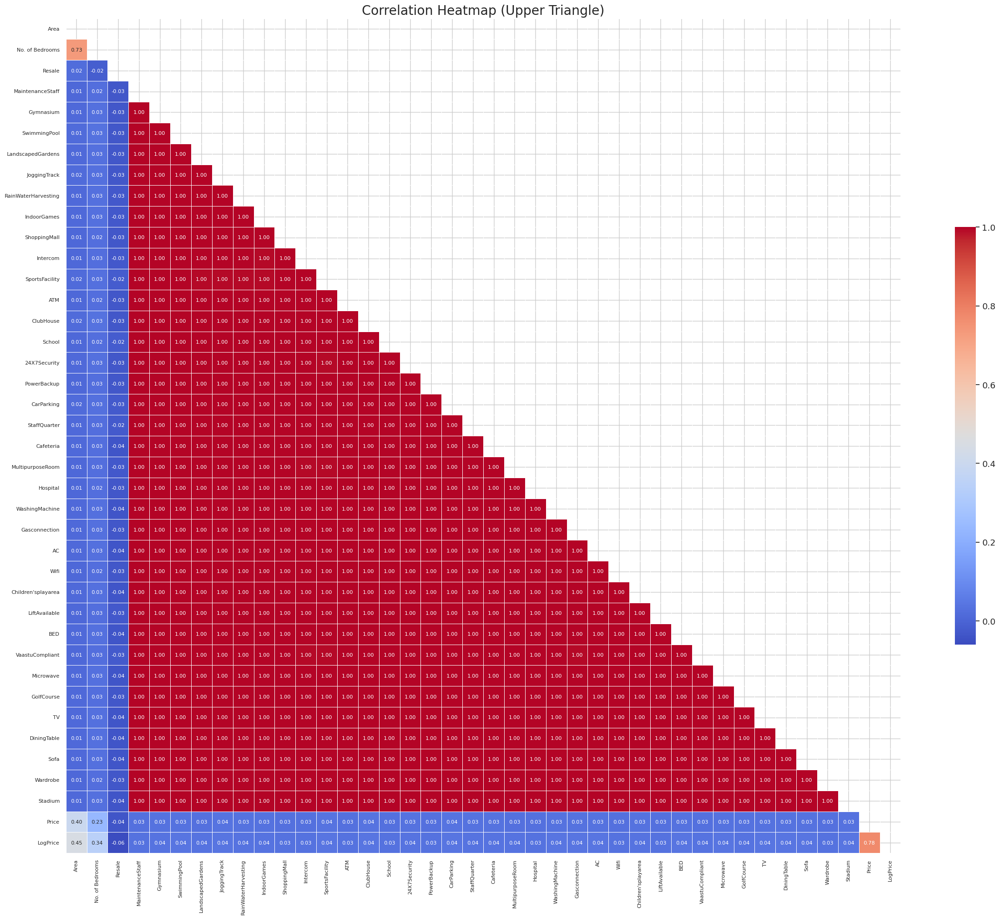

In [109]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix
corr_matrix = df.select_dtypes(include=['number']).corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure (adjust figsize as needed)
plt.figure(figsize=(25, 20))  # Wide and tall

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    annot_kws={"size": 8}
)

plt.title('Correlation Heatmap (Upper Triangle)', fontsize=20)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()


POSITIVE CORRELATION BETWEEN AREA AND PRICE , AREA AND NO OF BED ROOMS ARE OBSERVED

HANDLING LOCATIONS:

In [110]:
unique_locations = df['Location'].unique()
print(f"Number of unique cities: {len(unique_locations)}")
print(unique_locations)


Number of unique cities: 302
['JP Nagar Phase 1' 'Dasarahalli on Tumkur Road'
 'Kannur on Thanisandra Main Road' 'Doddanekundi' 'Kengeri' 'Horamavu'
 'Thanisandra' 'Ramamurthy Nagar' 'Whitefield Hope Farm Junction'
 'Electronic City Phase 1' 'Yelahanka' 'Anjanapura' 'Jalahalli'
 'Kasavanahalli' 'Bommasandra' 'Bellandur' 'RR Nagar' 'Begur' 'Hosa Road'
 'Sahakar Nagar' 'Kadugodi' 'Jakkur' 'Jigani' 'Krishnarajapura'
 'Brookefield' 'Banashankari' 'Nelamangala' 'Attibele' 'Banaswadi'
 'Kodigehalli' 'ITPL' 'Uttarahalli Hobli'
 'Chikkagubbi on Hennur Main Road' 'Varthur' 'Vidyaranyapura'
 'Electronic City Phase 2' 'J. P. Nagar' 'K. Chudahalli' 'Narayanaghatta'
 'Anekal City' 'Sarjapur' 'Koramangala' 'Hebbal' 'Budigere Cross'
 'Bommanahalli' 'Electronics City' 'Chikkalasandra' 'Kogilu'
 'Nayandahalli' 'Bilekahalli' 'Muneshwara Nagar' 'Junnasandra'
 'Narayanapura on Hennur Main Road' 'Kothanur' 'Kadugodi Industrial Area'
 'Sarjapur Road Wipro To Railway Crossing' 'RMV Extension Stage 2' 'Kudlu'

In [111]:
df['Location'].value_counts()


,count
Location,
Electronic City Phase 2,232
RR Nagar,217
Begur,186
Varthur,168
Kumaraswamy Layout,154
...,...
Bellari Road,1
Bhoopasandra,1
Kachanayakanahalli,1


# **Group Rare Locations & Encode**
Group rare cities as "Other"
To avoid sparse one-hot encoding and overfitting, group infrequent cities: Keep only locations with at least 30 listings, others become "Other"

In [112]:
# Keep only locations with at least 30 listings, others become "Other"
location_counts = df['Location'].value_counts()
rare_locations = location_counts[location_counts < 30].index

df['Location'] = df['Location'].apply(lambda x: 'Other' if x in rare_locations else x)


In [113]:
#2. One-hot encode the cleaned location column
df = pd.get_dummies(df, columns=['Location'], drop_first=True)


In [114]:
df.head()

,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,IndoorGames,...,Location_Subramanyapura,Location_Talaghattapura,Location_Thanisandra,Location_Uttarahalli,Location_Uttarahalli Main Road,Location_Varthur,Location_Whitefield Hope Farm Junction,Location_Yelahanka,Location_Yeshwantpur,Location_sarjapura attibele road
0,3340,4,0,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False
1,1045,2,0,0,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False
2,1179,2,0,0,1,1,1,1,1,0,...,False,False,False,False,False,False,False,False,False,False
3,1675,3,0,0,0,0,0,0,0,0,...,False,False,False,False,False,False,False,False,False,False
4,1670,3,0,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False


✅ 1. Use .corr() to check correlation of location with price
Since the location columns are binary, you can directly do:

In [115]:
location_columns = [col for col in df.columns if col.startswith("Location_")]
correlations = df[location_columns + ['LogPrice']].corr()['LogPrice'].sort_values(ascending=False)
print(correlations)

LogPrice                            1.000000
Location_Richmond Town              0.226280
Location_JP Nagar Phase 4           0.138835
Location_Rajajinagar                0.121536
Location_Hebbal                     0.111395
                                      ...   
Location_Sarjapur                  -0.067020
Location_Krishnarajapura           -0.072890
Location_Bommasandra               -0.086355
Location_Electronic City Phase 1   -0.102122
Location_Attibele                  -0.136437
Name: LogPrice, Length: 65, dtype: float64


# **✅ 2. Use groupby to see average price per location**

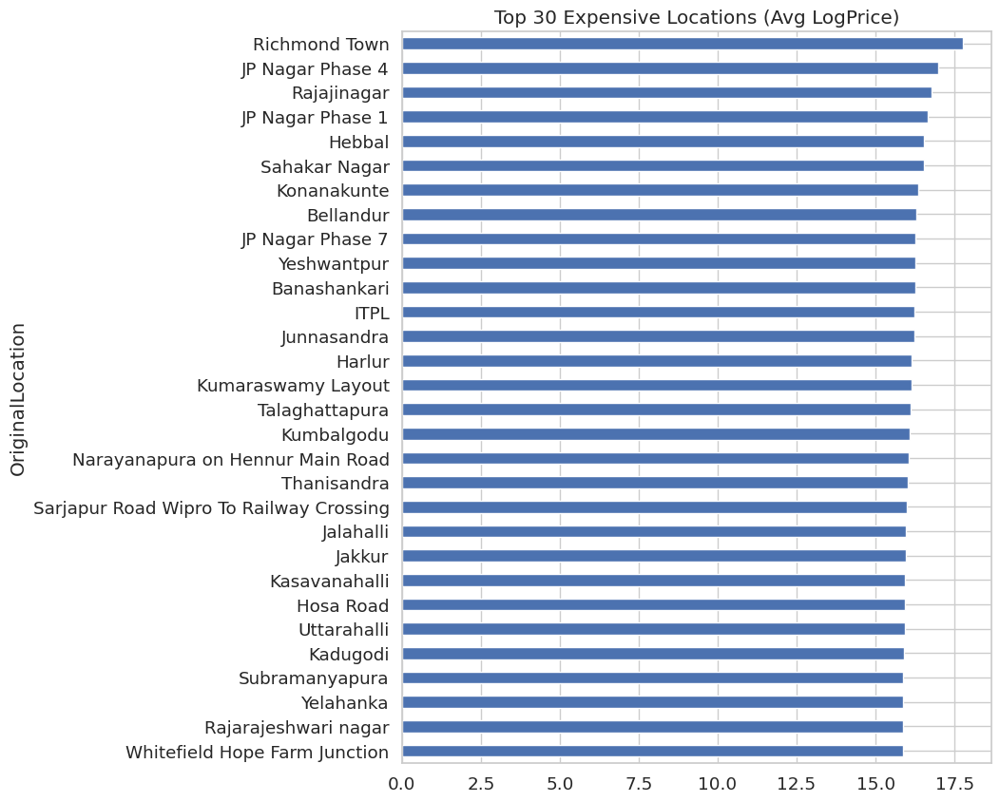

In [116]:
# Recover original location column from one-hot
df['OriginalLocation'] = df[location_columns].idxmax(axis=1).str.replace("Location_", "")

# Group and visualize
location_avg = df.groupby('OriginalLocation')['LogPrice'].mean().sort_values(ascending=False)

import matplotlib.pyplot as plt
location_avg.head(30).plot(kind='barh', figsize=(8, 10), title="Top 30 Expensive Locations (Avg LogPrice)")
plt.gca().invert_yaxis()
plt.show()


In [117]:
# Show columns that are not numeric
non_numeric_cols = df.select_dtypes(include=['object', 'category']).columns
print("Non-numeric columns:", non_numeric_cols)



Non-numeric columns: Index(['OriginalLocation'], dtype='object')


In [118]:
df.drop('OriginalLocation', axis=1, inplace=True)


In [119]:
print(df.dtypes)

Area                                      int64
No. of Bedrooms                           int64
Resale                                    int64
MaintenanceStaff                          int64
Gymnasium                                 int64
                                          ...  
Location_Varthur                           bool
Location_Whitefield Hope Farm Junction     bool
Location_Yelahanka                         bool
Location_Yeshwantpur                       bool
Location_sarjapura attibele road           bool
Length: 104, dtype: object


TRAINING THE MODEL WITH LOG PRICE

In [120]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

# -----------------------------
# 📦 Prepare Data
# -----------------------------

# Assume df is your preprocessed DataFrame
# Target: LogPrice (already log-transformed)
# Features: All except 'Price', 'LogPrice' (if present)
X = df.drop(['Price', 'LogPrice'], axis=1, errors='ignore')
y = df['LogPrice']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -----------------------------
# 📊 Define Models
# -----------------------------

models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

# -----------------------------
# 🏋️ Train & Evaluate
# -----------------------------

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# -----------------------------
# 📈 Show Results
# -----------------------------

results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R2 Score']).sort_values(by='RMSE')
print(results_df)


               Model      RMSE  R2 Score
4            XGBoost  0.491986  0.434167
1   Ridge Regression  0.525452  0.354572
0  Linear Regression  0.525923  0.353412
3      Random Forest  0.528710  0.346541
2   Lasso Regression  0.567425  0.247340


In [121]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

# -----------------------------
# 📦 Prepare Data
# -----------------------------

# Assume df is your preprocessed DataFrame
# Target: LogPrice (already log-transformed)
# Features: All except 'Price', 'LogPrice' (if present)
X = df.drop(['Price', 'LogPrice'], axis=1, errors='ignore')
y = df['Price']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -----------------------------
# 📊 Define Models
# -----------------------------

models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

# -----------------------------
# 🏋️ Train & Evaluate
# -----------------------------

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))

# -----------------------------
# 📈 Show Results
# -----------------------------

results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R2 Score']).sort_values(by='RMSE')
print(results_df)


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.246e+17, tolerance: 9.021e+13
  model = cd_fast.enet_coordinate_descent(


               Model          RMSE  R2 Score
4            XGBoost  1.463623e+07  0.201857
2   Lasso Regression  1.475897e+07  0.188415
1   Ridge Regression  1.476317e+07  0.187953
0  Linear Regression  1.476623e+07  0.187615
3      Random Forest  1.476825e+07  0.187393


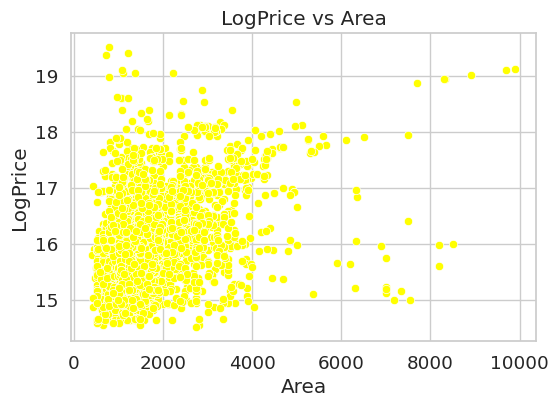

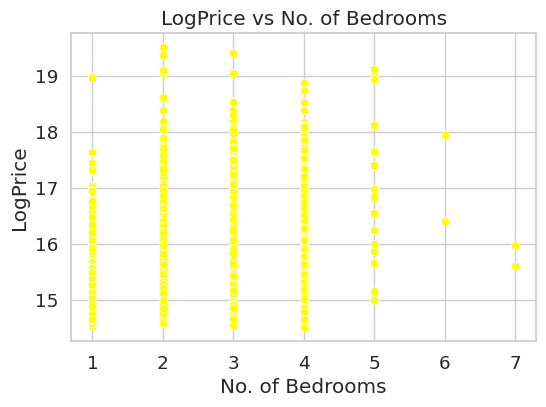

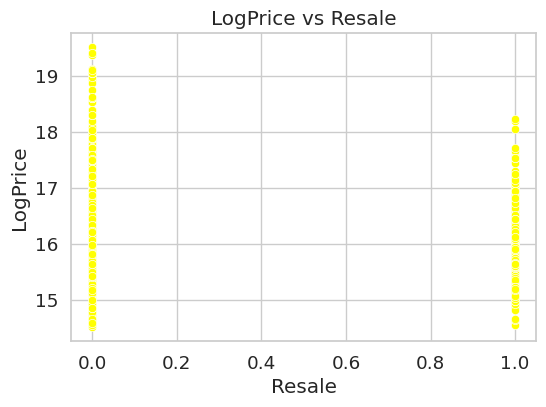

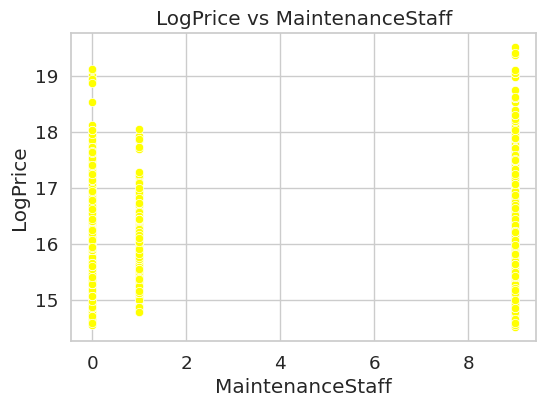

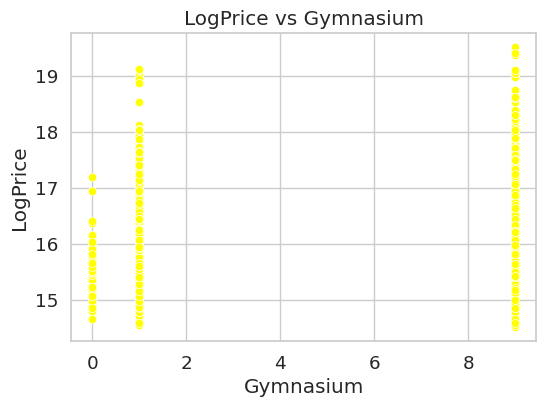

...

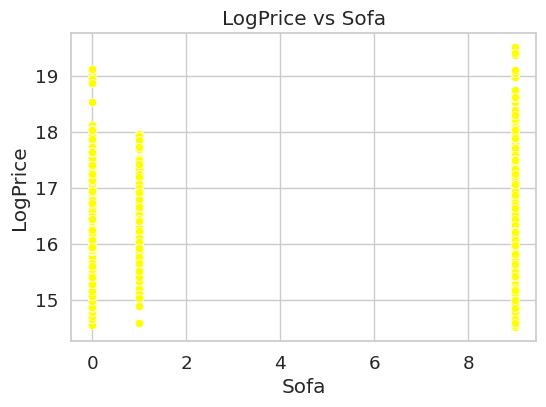

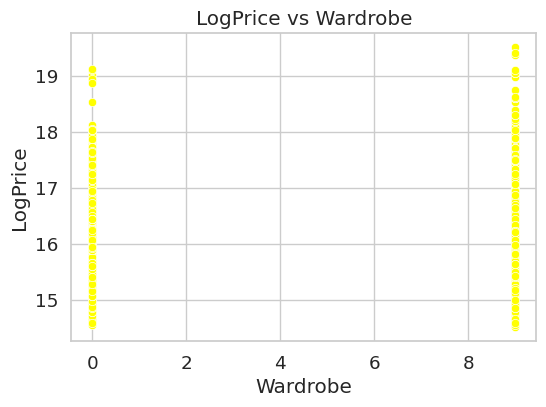

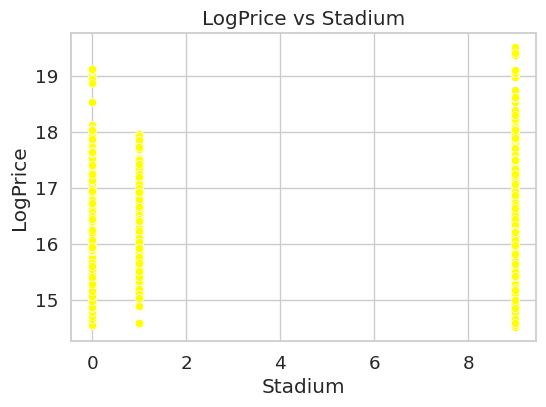

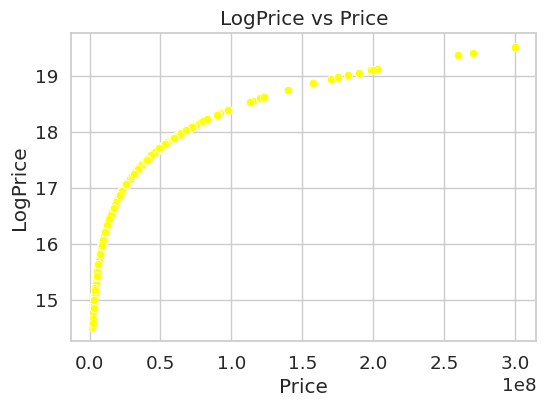

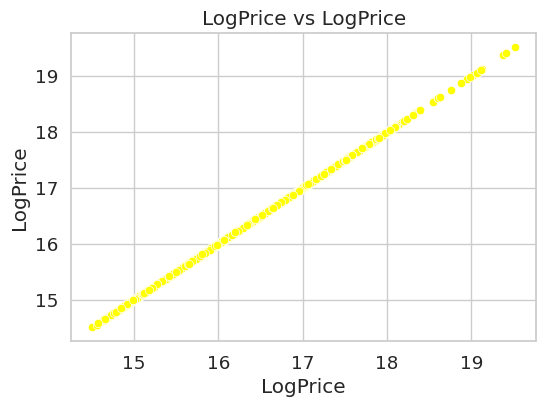

In [122]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])
for col in numeric_df:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=df[col], y=df['LogPrice'], color='yellow')
    plt.title(f'LogPrice vs {col}')
    plt.xlabel(col)
    plt.ylabel('LogPrice')
    plt.grid(True)
    plt.show()

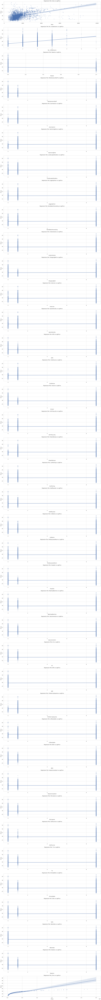

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

# Replace 'df' with your actual DataFrame name if different
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
numerical_features = numerical_features.drop('LogPrice')  # Exclude target column

# Set up the plot
plt.figure(figsize=(20, len(numerical_features) * 5))

for idx, feature in enumerate(numerical_features):
    plt.subplot(len(numerical_features), 1, idx + 1)
    sns.regplot(x=df[feature], y=df['LogPrice'], scatter_kws={'alpha':0.3})
    plt.title(f'Regression Plot: {feature} vs LogPrice', fontsize=14)
    plt.xlabel(feature)
    plt.ylabel("Price")

plt.tight_layout()
plt.show()


In [124]:
df.corr(numeric_only=True)['LogPrice'].sort_values(ascending=False)


,LogPrice
LogPrice,1.000000
Price,0.776215
Area,0.448697
No. of Bedrooms,0.344154
Location_Richmond Town,0.226280
...,...
Location_Sarjapur,-0.067020
Location_Krishnarajapura,-0.072890
Location_Bommasandra,-0.086355
Location_Electronic City Phase 1,-0.102122


✅ Step 1: Calculate Correlation with Target
You can do this for Price or LogPrice, depending on what you're using:

In [125]:
# Step 1: Get correlations with LogPrice
correlations = df.corr()['LogPrice'].sort_values()

# Step 2: Get features with negative correlation only (excluding 'LogPrice' automatically)
negative_corr_features = correlations[correlations < 0].index.tolist()

# Step 3: Drop those features from the DataFrame
df_reduced = df.drop(columns=negative_corr_features)


In [126]:
print("Negatively correlated features being removed:")
print(negative_corr_features)


Negatively correlated features being removed:
['Location_Attibele', 'Location_Electronic City Phase 1', 'Location_Bommasandra', 'Location_Krishnarajapura', 'Location_Sarjapur', 'Location_Horamavu', 'Location_Anekal City', 'Resale', 'Location_sarjapura attibele road', 'Location_RR Nagar', 'Location_Budigere Cross', 'Location_Devanahalli', 'Location_Chandapura', 'Location_Other', 'Location_Avalahalli Off Sarjapur Road', 'Location_Ramamurthy Nagar', 'Location_Gottigere', 'Location_Kalyan Nagar', 'Location_JP Nagar Phase 8', 'Location_Kannur on Thanisandra Main Road', 'Location_Nelamangala', 'Location_Carmelaram', 'Location_Begur', 'Location_Kammanahalli', 'Location_Uttarahalli Main Road', 'Location_Electronic City Phase 2', 'Location_Hennur', 'Location_Kengeri', 'Location_JP Nagar Phase 3', 'Location_Poornapragna Housing Society Layout', 'Location_Varthur', 'Location_Anjanapura', 'Location_Kanakapura Road Beyond Nice Ring Road', 'Location_Whitefield Hope Farm Junction', 'Location_Bommanah

In [127]:
from sklearn.model_selection import train_test_split

# Separate target and features
X = df_reduced.drop(columns=['LogPrice', 'Price'])  # drop targets from features
y = df_reduced['LogPrice']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [128]:
#LETS TRAIN AGAIN
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, verbosity=0)
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    r2 = r2_score(y_test, preds)
    results.append((name, rmse, r2))

# Convert to DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'RMSE', 'R2 Score']).sort_values(by='R2 Score', ascending=False)
print(results_df)


               Model      RMSE  R2 Score
4            XGBoost  0.495120  0.426934
3      Random Forest  0.525314  0.354910
1   Ridge Regression  0.530095  0.343115
0  Linear Regression  0.530458  0.342214
2   Lasso Regression  0.567517  0.247094


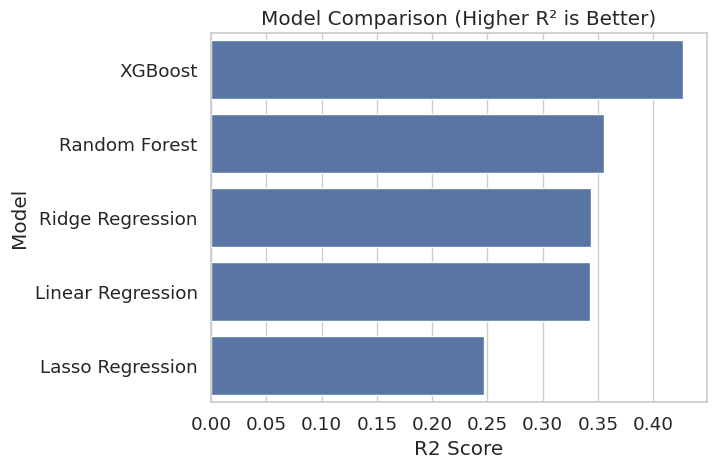

In [129]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(data=results_df, x='R2 Score', y='Model')
plt.title("Model Comparison (Higher R² is Better)")
plt.show()


# **✅ 1. Feature Importance Plot (XGBoost + Random Forest)**

Visualizing which features are driving predictions.

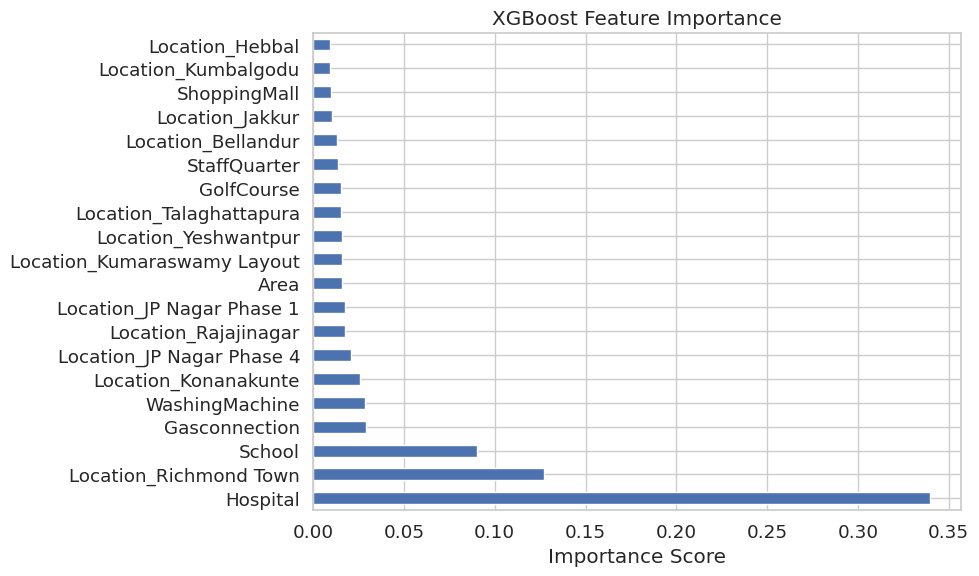

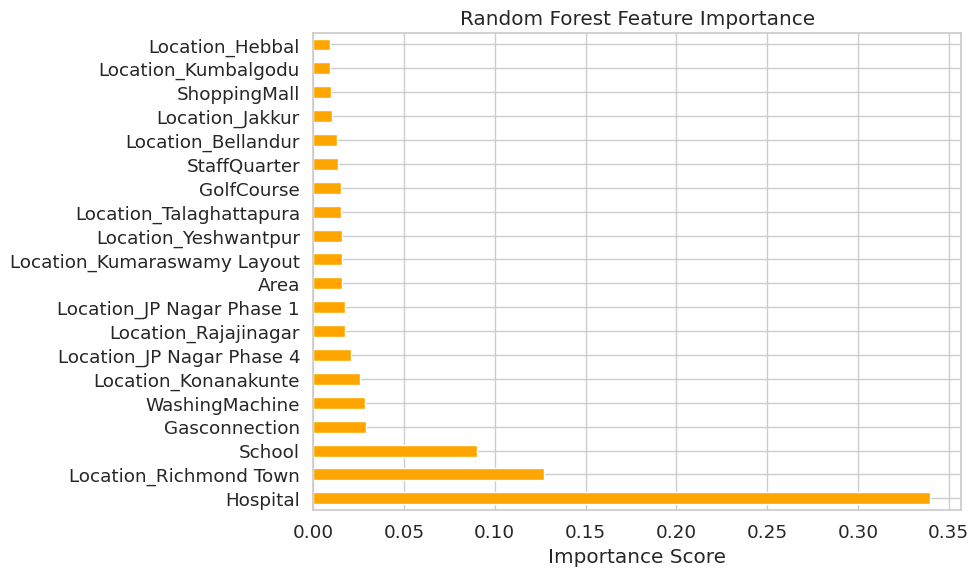

In [130]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# XGBoost Feature Importance
model.fit(X_train, y_train)
xgb_importance = pd.Series(model.feature_importances_, index=X_train.columns)
xgb_importance.nlargest(20).plot(kind='barh', figsize=(10,6), title='XGBoost Feature Importance')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

# Random Forest Feature Importance
model.fit(X_train, y_train)
rf_importance = pd.Series(model.feature_importances_, index=X_train.columns)
rf_importance.nlargest(20).plot(kind='barh', figsize=(10,6), title='Random Forest Feature Importance', color='orange')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()


# **⚙️ 2. GridSearchCV for XGBoost (Hyperparameter Tuning)**
Use this to find the best combination of hyperparameters.

In [131]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}

xgb = XGBRegressor(random_state=42)
grid = GridSearchCV(xgb, param_grid, scoring='r2', cv=5, n_jobs=-1, verbose=2)
grid.fit(X_train, y_train)

print("Best Parameters:", grid.best_params_)
print("Best R² Score:", grid.best_score_)


Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1}
Best R² Score: 0.3617435653484102


In [132]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


final_xgb = XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=100,
    subsample=1,
    random_state=42
)

final_xgb.fit(X_train, y_train)

# Evaluate on Test Set
y_pred = final_xgb.predict(X_test)
mse = mean_squared_error(y_test, y_pred)  # squared=True by default
print("Mean Squared Error:", mse)

rmse = mean_squared_error(y_test, y_pred)
print("Root Mean Squared Error:", rmse)

r2 = r2_score(y_test, y_pred)

print(f"Final XGBoost Test RMSE: {rmse:.4f}")
print(f"Final XGBoost Test R²: {r2:.4f}")


Mean Squared Error: 0.2457069500902857
Root Mean Squared Error: 0.2457069500902857
Final XGBoost Test RMSE: 0.2457
Final XGBoost Test R²: 0.4256


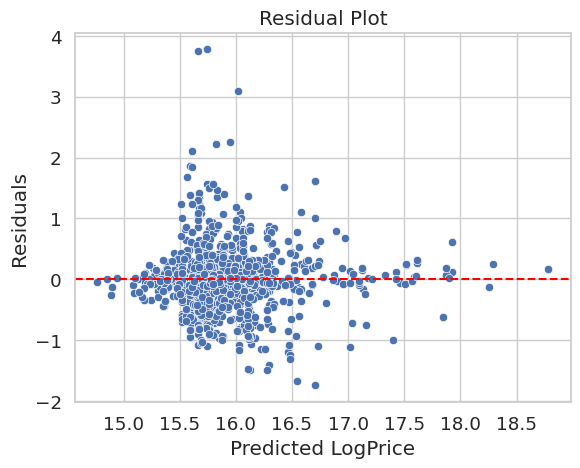

In [133]:
import seaborn as sns

residuals = y_test - y_pred
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted LogPrice")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.show()


✅ Our Model is Not Biased
Residuals (errors between actual and predicted values) are randomly distributed across the range of target values (LogPrice).

The horizontal line at zero suggests:

No pattern in the errors.

Model predictions are equally good (or equally off) across cheap and expensive properties.

📈 Ideal Residual Plot Looks Like:
A cloud of points around the zero line.

No clear pattern, curve, or funnel shape.

Homoscedasticity (constant variance of errors) — another good sign!

Great! Here's how to interpret your final **XGBoost** model evaluation:

---

### ✅ **Final Model Performance (on LogPrice)**

| Metric       | Value  | Interpretation                                                                          |
| ------------ | ------ | --------------------------------------------------------------------------------------- |
| **MSE**      | 0.2457 | Average squared error between predicted and actual log prices. Lower is better.         |
| **RMSE**     | 0.2457 | Since log-price was used, this is in **log-units**. Lower = better prediction accuracy. |
| **R² Score** | 0.4256 | \~42.5% of the variance in log prices is explained by your model.                       |

---

### 💡 Notes:

* **RMSE ≈ 0.245** in **log-scale** is quite reasonable. In linear price scale, it would mean your predictions are off by a factor of about `e^0.245 ≈ 1.28`, i.e., \~28% error.
* **R² = 0.43**  is a **decent baseline**.


In [134]:
# Use best estimator from grid search to predict
best_xgb = grid.best_estimator_
y_pred = best_xgb.predict(X_test)


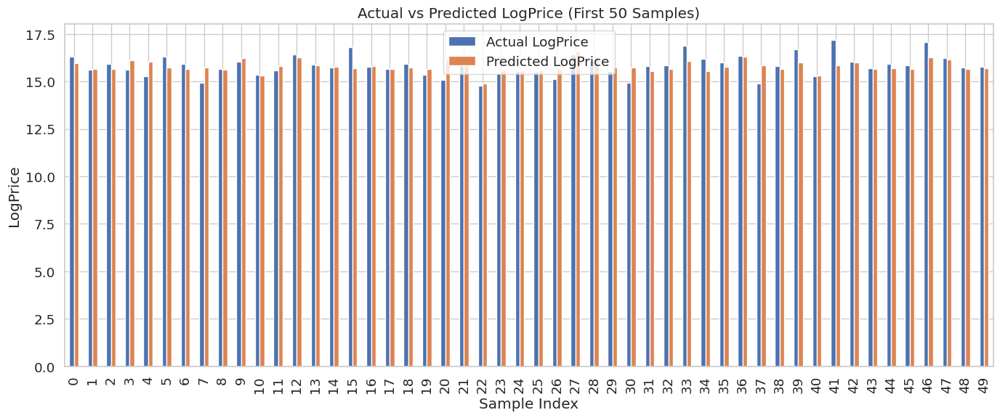

In [135]:
import pandas as pd

comparison_df = pd.DataFrame({
    'Actual LogPrice': y_test.values,
    'Predicted LogPrice': y_pred
}).reset_index(drop=True)

# Plot bar chart for first 50 samples
comparison_df.head(50).plot(kind='bar', figsize=(14, 6))
plt.title('Actual vs Predicted LogPrice (First 50 Samples)')
plt.ylabel('LogPrice')
plt.xlabel('Sample Index')
plt.tight_layout()
plt.show()


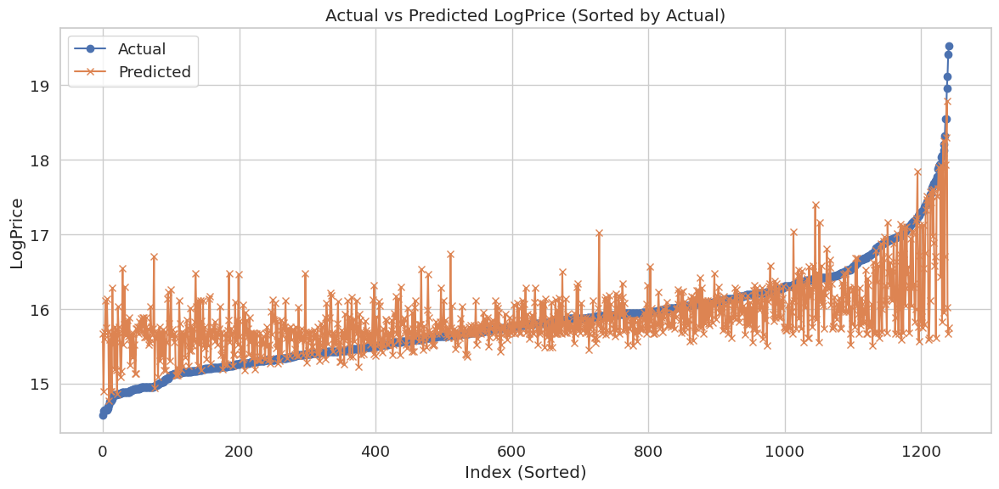

In [136]:
comparison_sorted = comparison_df.sort_values(by='Actual LogPrice').reset_index(drop=True)

plt.figure(figsize=(12, 6))
plt.plot(comparison_sorted['Actual LogPrice'], label='Actual', marker='o')
plt.plot(comparison_sorted['Predicted LogPrice'], label='Predicted', marker='x')
plt.legend()
plt.title('Actual vs Predicted LogPrice (Sorted by Actual)')
plt.ylabel('LogPrice')
plt.xlabel('Index (Sorted)')
plt.grid(True)
plt.tight_layout()
plt.show()


# **✅ Visualizing Actual vs Predicted for All Models**

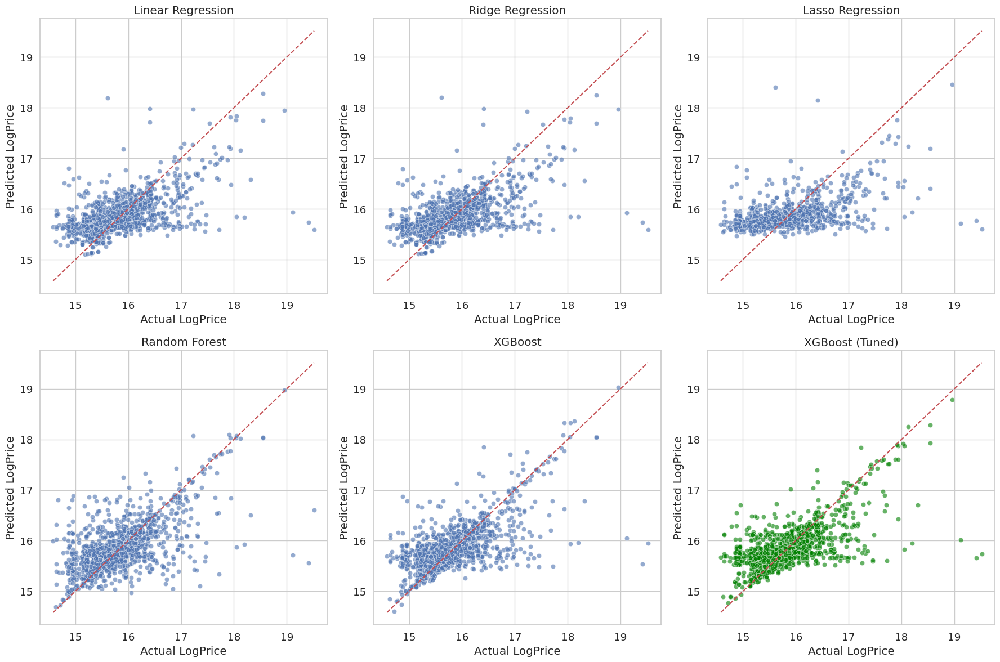

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with subplots for each model
plt.figure(figsize=(18, 12))

for i, (name, model) in enumerate(models.items(), 1):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)

    plt.subplot(2, 3, i)
    sns.scatterplot(x=y_test, y=preds, alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Ideal line
    plt.xlabel("Actual LogPrice")
    plt.ylabel("Predicted LogPrice")
    plt.title(f"{name}")

# Final XGBoost with best parameters
final_preds = final_xgb.predict(X_test)
plt.subplot(2, 3, 6)
sns.scatterplot(x=y_test, y=final_preds, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual LogPrice")
plt.ylabel("Predicted LogPrice")
plt.title("XGBoost (Tuned)")

plt.tight_layout()
plt.show()


In [150]:
import pandas as pd

# Dictionary of models you already trained
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, verbosity=0),
    "final_xgb" : XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=100,
    subsample=1,
    random_state=42
)

}

# Initialize a DataFrame with actual values
comparison_df = pd.DataFrame({'Actual': y_test.reset_index(drop=True)})

# Fit and predict for each model, storing predictions
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    comparison_df[name] = preds

# Display first few rows of the result
print(comparison_df.head(10))

# Optionally: Save to CSV
comparison_df.to_csv("actual_vs_predicted_comparison.csv", index=False)


      Actual  Linear Regression  Ridge Regression  Lasso Regression  \
0  16.308716          16.166410         16.174571         16.372442   
1  15.607270          15.675236         15.677402         15.740552   
2  15.917203          15.661810         15.663753         15.719741   
3  15.636020          15.900074         15.904893         16.024335   
4  15.268763          15.827559         15.832250         15.976659   
5  16.308716          15.756364         15.750896         15.568390   
6  15.928750          15.752388         15.754760         15.795416   
7  14.929012          15.778019         15.780816         15.835146   
8  15.638123          15.624705         15.626034         15.662228   
9  16.034714          16.320199         16.330908         16.610819   

   Random Forest    XGBoost  final_xgb  
0      15.746171  15.909833  15.965390  
1      15.762528  15.644322  15.663568  
2      15.907254  15.775060  15.674280  
3      15.994050  16.104019  16.116476  
4      16.305

In [139]:
#FURURE PRICE PREDICTION
df.head()
df.shape
print(df.columns.tolist())


['Area', 'No. of Bedrooms', 'Resale', 'MaintenanceStaff', 'Gymnasium', 'SwimmingPool', 'LandscapedGardens', 'JoggingTrack', 'RainWaterHarvesting', 'IndoorGames', 'ShoppingMall', 'Intercom', 'SportsFacility', 'ATM', 'ClubHouse', 'School', '24X7Security', 'PowerBackup', 'CarParking', 'StaffQuarter', 'Cafeteria', 'MultipurposeRoom', 'Hospital', 'WashingMachine', 'Gasconnection', 'AC', 'Wifi', "Children'splayarea", 'LiftAvailable', 'BED', 'VaastuCompliant', 'Microwave', 'GolfCourse', 'TV', 'DiningTable', 'Sofa', 'Wardrobe', 'Stadium', 'Price', 'LogPrice', 'Location_Anekal City', 'Location_Anjanapura', 'Location_Attibele', 'Location_Avalahalli Off Sarjapur Road', 'Location_Banashankari', 'Location_Begur', 'Location_Bellandur', 'Location_Bommanahalli', 'Location_Bommasandra', 'Location_Budigere Cross', 'Location_Carmelaram', 'Location_Chandapura', 'Location_Dasarahalli on Tumkur Road', 'Location_Devanahalli', 'Location_Electronic City Phase 1', 'Location_Electronic City Phase 2', 'Location_G

In [140]:
df.head()

,Area,No. of Bedrooms,Resale,MaintenanceStaff,Gymnasium,SwimmingPool,LandscapedGardens,JoggingTrack,RainWaterHarvesting,IndoorGames,...,Location_Subramanyapura,Location_Talaghattapura,Location_Thanisandra,Location_Uttarahalli,Location_Uttarahalli Main Road,Location_Varthur,Location_Whitefield Hope Farm Junction,Location_Yelahanka,Location_Yeshwantpur,Location_sarjapura attibele road
0,3340,4,0,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False
1,1045,2,0,0,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False
2,1179,2,0,0,1,1,1,1,1,0,...,False,False,False,False,False,False,False,False,False,False
3,1675,3,0,0,0,0,0,0,0,0,...,False,False,False,False,False,False,False,False,False,False
4,1670,3,0,1,1,1,1,1,1,1,...,False,False,False,False,False,False,False,False,False,False


In [166]:
# Make sure you have these:
import numpy as np
import pandas as pd

# Reuse the columns from training
feature_columns = X_train.columns

# Create empty DataFrame row
new_data = pd.DataFrame([np.zeros(len(feature_columns))], columns=feature_columns)

# Fill values for the new property (example)
new_data.at[0, 'Area'] = 1250
new_data.at[0, 'No. of Bedrooms'] = 2
#new_data.at[0, 'Resale'] = 0
new_data.at[0, 'Gymnasium'] = 1
new_data.at[0, 'SwimmingPool'] = 1
new_data.at[0, 'LiftAvailable'] = 1
new_data.at[0, 'CarParking'] = 1
new_data.at[0, 'PowerBackup'] = 1
new_data.at[0, 'VaastuCompliant'] = 1
new_data.at[0, 'Wardrobe'] = 1

# Set the desired location - exactly one should be 1
#new_data.at[0, 'Location_Electronic City Phase 1'] = 1


In [167]:
predictions = []

for name, model in models.items():
    pred_log_price = model.predict(new_data)[0]
    pred_price = int(np.exp(pred_log_price))  # Convert log(price) to actual price
    predictions.append((name, pred_log_price, pred_price))

# Convert to DataFrame
pred_df = pd.DataFrame(predictions, columns=['Model', 'Log Price', 'Predicted Price (₹)'])
print(pred_df)


               Model  Log Price  Predicted Price (₹)
0  Linear Regression  15.442818              5090152
1   Ridge Regression  15.459355              5175024
2   Lasso Regression  15.778390              7119795
3      Random Forest  15.577068              5821494
4            XGBoost  15.432148              5036127
5          final_xgb  15.547283              5650661
